In [73]:
import os
import numpy as np
from statsmodels.stats.multitest import fdrcorrection
import scipy.stats as stats
import pickle
import csv
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy import stats
from nilearn.image import new_img_like
import pandas as pd
import nibabel as nib
import seaborn as sns
from nilearn import plotting
from rsatoolbox.inference import eval_fixed
from rsatoolbox.model import ModelFixed
from rsatoolbox.rdm import RDMs
from glob import glob
from rsatoolbox.util.searchlight import get_volume_searchlight, get_searchlight_RDMs, evaluate_models_searchlight

import torch
from torch import optim, nn
from torchvision import models, transforms
from tqdm import tqdm
import cv2
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor

In [2]:
def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM

    Args:
        RDM 2Darray: squareform RDM

    Returns:
        1D array: upper triangular vector of the RDM
    """
    # returns the upper triangle
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

In [3]:
import matplotlib.colors
def RDMcolormapObject(direction=1):
    """
    Returns a matplotlib color map object for RSA and brain plotting
    """
    if direction == 0:
        cs = ['yellow', 'red', 'gray', 'turquoise', 'blue']
    elif direction == 1:
        cs = ['blue', 'turquoise', 'gray', 'red', 'yellow']
    else:
        raise ValueError('Direction needs to be 0 or 1')
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", cs)
    return cmap

## Import neural RDM

In [4]:
dbfile = open('./outputs/20sub_nerual_6content_rdm2', 'rb')     
allsub_avg = pickle.load(dbfile)

In [5]:
len(allsub_avg)

20

### Plot one stimulus image out of the 60 images 

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



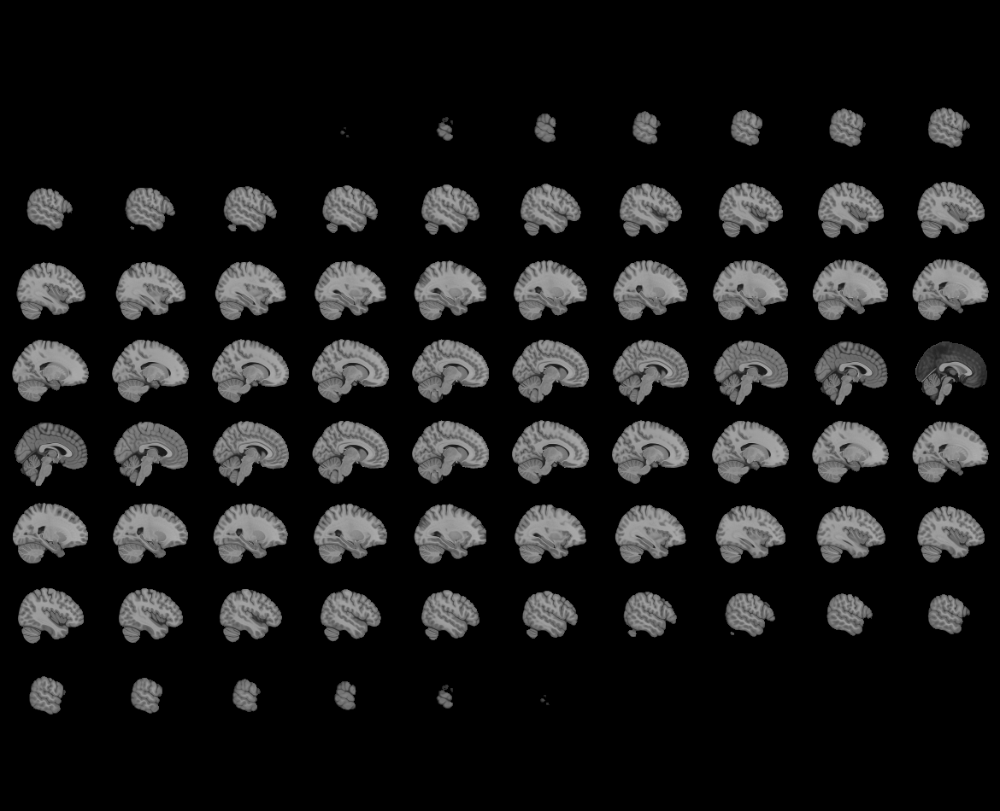
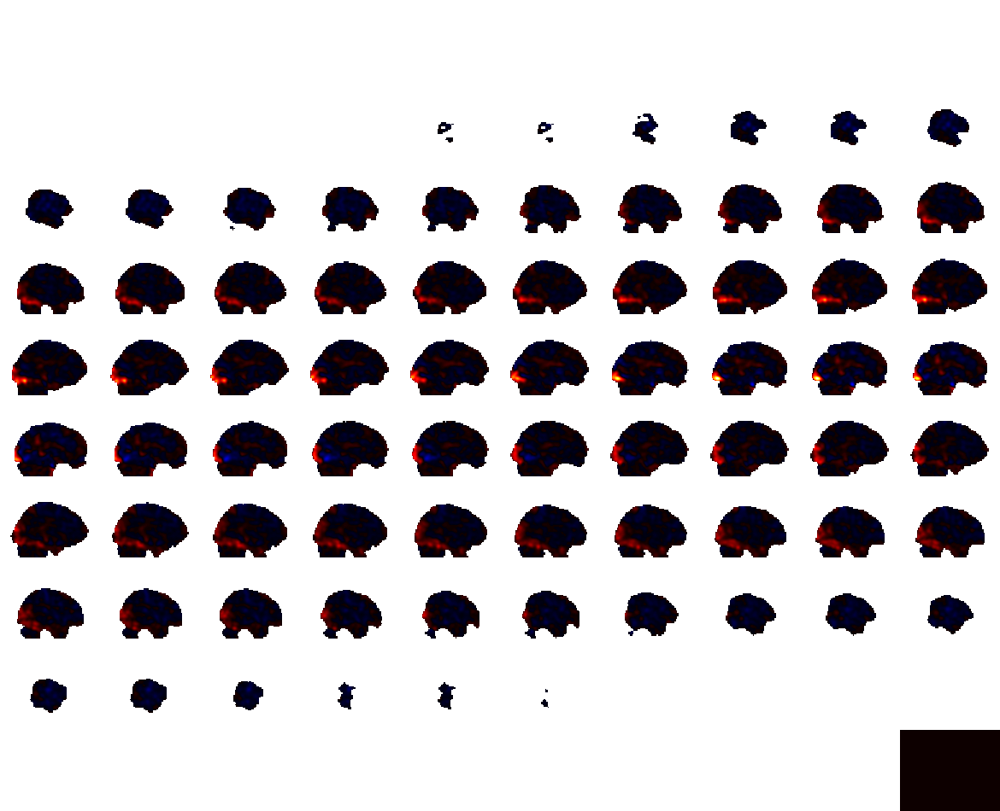

In [71]:
plot_slice = np.array(allsub_avg[4])[1,:]
plot_slice_3d = plot_slice.reshape(53, 63, 46)
plot_neural_rdm_cont1 = new_img_like(tmp_img, plot_slice_3d)
view = plotting.view_img(plot_neural_rdm_cont1)
view

## Load CNN model and compute NN RDMs

In [6]:
# Transform the image, so it becomes readable with the model
transform = transforms.Compose([
  transforms.ToPILImage(),
  transforms.CenterCrop(512),
  transforms.Resize(224),
  transforms.ToTensor()                              
])

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = models.vgg16(pretrained=True)
nodes, _ = get_graph_node_names(model)
print(nodes)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


['x', 'features.0', 'features.1', 'features.2', 'features.3', 'features.4', 'features.5', 'features.6', 'features.7', 'features.8', 'features.9', 'features.10', 'features.11', 'features.12', 'features.13', 'features.14', 'features.15', 'features.16', 'features.17', 'features.18', 'features.19', 'features.20', 'features.21', 'features.22', 'features.23', 'features.24', 'features.25', 'features.26', 'features.27', 'features.28', 'features.29', 'features.30', 'avgpool', 'flatten', 'classifier.0', 'classifier.1', 'classifier.2', 'classifier.3', 'classifier.4', 'classifier.5', 'classifier.6']


### Define NN layers to extract feature maps

In [11]:
# Confused about the node specification here?
# We are allowed to provide truncated node names, and `create_feature_extractor`
# will choose the last node with that prefix.
feature_extractor = create_feature_extractor(
    model, return_nodes=['features.4', 
                         'features.9', 
                         'features.16', 
                         'features.23',
                         'features.30',
                         'classifier.0',
                         'classifier.3'
                        ])

### Define input images

In [8]:
file = pd.read_csv("./IAPS_60_pnu.csv")
# file = pd.read_csv("./IAPS_60_npu.csv") #intentionally using a error file to show the result will be wrong accordingly.
filenames = file['iaps_id']
filenames

0     4680
1     4641
2     8250
3     8186
4     4626
5     2057
6     4624
7     4311
8     4597
9     4694
10    4610
11    2332
12    8030
13    2655
14    4658
15    2345
16    4599
17    4695
18    4693
19    4668
20    2305
21    2347
22    2398
23    5781
24    5600
25    2387
26    2374
27    2032
28    8034
29    2635
30    2102
31    2036
32    2411
33    2191
34    2037
35    2377
36    5700
37    2499
38    5814
39    5900
40    3030
41    3051
42    1120
43    6550
44    3150
45    1300
46    9253
47    1114
48    3069
49    1302
50    1931
51    3000
52    1220
53    9420
54    6230
55    9571
56    1205
57    9008
58    1271
59    9181
Name: iaps_id, dtype: int64

### Compute feature maps

In [12]:
### Compute featur# Will contain the feature
features_pl_1 = []
features_pl_2 = []
features_pl_3 = []
features_pl_4 = []
features_pl_5 = []
features_fc_1 = []
features_fc_2 = []


# Iterate each image
for i, filename in enumerate(filenames):
    # Set the image path
    path = os.path.join('./data/raw_iaps/{}.jpg'.format(filename))
    # Read the file
    img = cv2.imread(path)
    # Transform the image
    img = transform(img)
    # Reshape the image. PyTorch model reads 4-dimensional tensor
    # [batch_size, channels, width, height]
    img = img.reshape(1, 3, 224, 224)
    img = img.to(device)
    
    # `out` will be a dict of Tensors, each representing a feature map
    feature = feature_extractor(img)
    
    feature_pl_1 = feature['features.4']
    feature_pl_2 = feature['features.9']
    feature_pl_3 = feature['features.16']
    feature_pl_4 = feature['features.23']
    feature_pl_5 = feature['features.30']
    feature_fc_1 = feature['classifier.0']
    feature_fc_2 = feature['classifier.3']
    
    # Convert to NumPy Array, Reshape it, and save it to features variable
    features_pl_1.append(feature_pl_1.cpu().detach().numpy().reshape(-1))
    features_pl_2.append(feature_pl_2.cpu().detach().numpy().reshape(-1))
    features_pl_3.append(feature_pl_3.cpu().detach().numpy().reshape(-1))
    features_pl_4.append(feature_pl_4.cpu().detach().numpy().reshape(-1))
    features_pl_5.append(feature_pl_5.cpu().detach().numpy().reshape(-1))
    features_fc_1.append(feature_fc_1.cpu().detach().numpy().reshape(-1))
    features_fc_2.append(feature_fc_2.cpu().detach().numpy().reshape(-1))

# Convert to NumPy Array
features_pl_1 = np.array(features_pl_1)
features_pl_2 = np.array(features_pl_2)
features_pl_3 = np.array(features_pl_3)
features_pl_4 = np.array(features_pl_4)
features_pl_5 = np.array(features_pl_5)
features_fc_1 = np.array(features_fc_1)
features_fc_2 = np.array(features_fc_2)

In [14]:
features_pl_1.shape


(60, 802816)

## Group the trials into 6 content categories

In [16]:
stim_file = pd.read_csv('../IAPS_fMRI_RSA/trial_contentcategory_ordered.csv')
stimuli = stim_file[:].reset_index()
stimuli_id = pd.DataFrame(stimuli[['category']]).T
stimuli_id.shape


(1, 60)

### Compute NN layer RDMs

In [32]:
features_list = [features_pl_1, features_pl_2, features_pl_3, features_pl_4, features_pl_5, features_fc_1, features_fc_2]
# # To use only the 10% NN neurons
# features_list = [features_pl_1_t10per, features_pl_2_t10per, features_pl_3_t10per, features_pl_4_t10per, features_pl_5_t10per, features_fc_1_t10per, features_fc_2_t10per]

nn_rdms = []
for i, feat in enumerate(features_list):
    print("Shape of the layer: {}".format(features_list[i].shape))
    # nn_rdm = pairwise_distances(features_list[i], metric='correlation')
    feat = pd.DataFrame(features_list[i].T)
    feat_id = pd.concat([stimuli_id, feat]).T
    feat_id['category'] = pd.Categorical(feat_id['category'], ["erotic/romance", "happy people", "adventure/nature", "ntr people", "attack", "mutil/disgust" ])
    feat_avg = feat_id.groupby('category').mean() #(6, [# of neurons in fmaps]) 
    nn_rdm = 1-feat_avg.T.corr(method="spearman") # "corr"
    nn_rdm = np.nan_to_num(nn_rdm)
    print("Shape of the layer RDM: {}".format(nn_rdm.shape))
    nn_rdms.append(nn_rdm)

Shape of the layer: (60, 802816)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 401408)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 200704)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 100352)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 25088)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 4096)
Shape of the layer RDM: (6, 6)
Shape of the layer: (60, 4096)
Shape of the layer RDM: (6, 6)


### Compute NN layer RDM models

In [35]:
nn_rdm_models = []
for i, rdm in enumerate(nn_rdms):
    nn_rdm_model = ModelFixed('Layer {} RDM'.format(i), upper_tri(rdm))
    nn_rdm_models.append(nn_rdm_model)

## Searchlight analysis

### Requirements for Searchlight

Mask

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



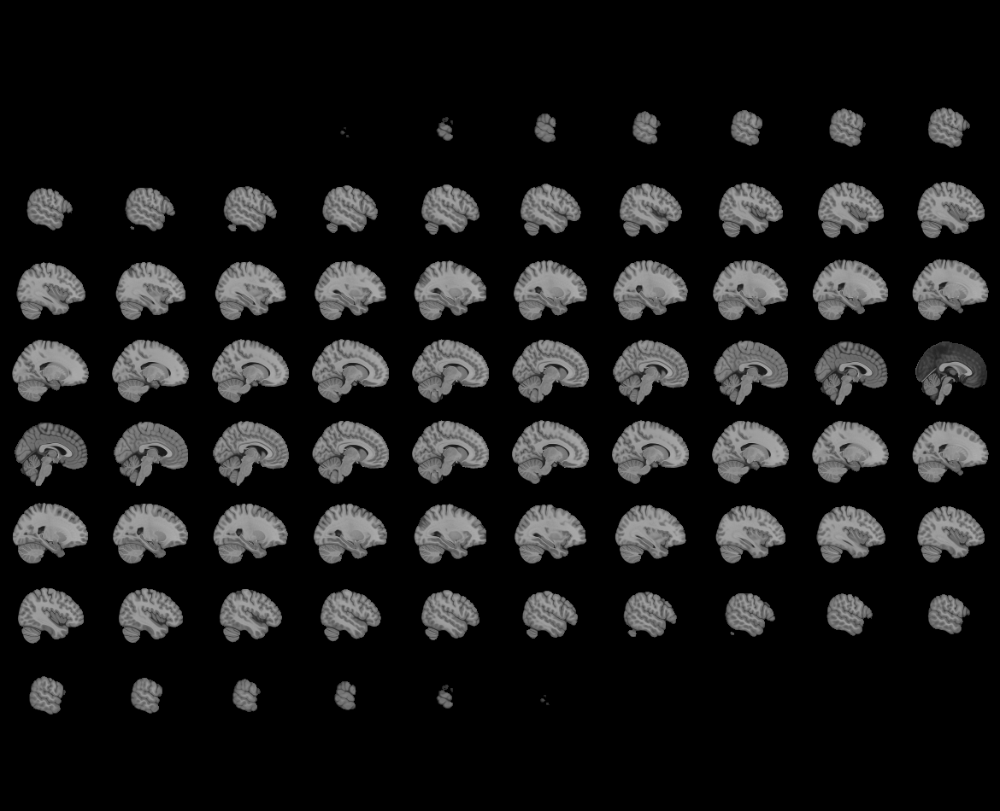
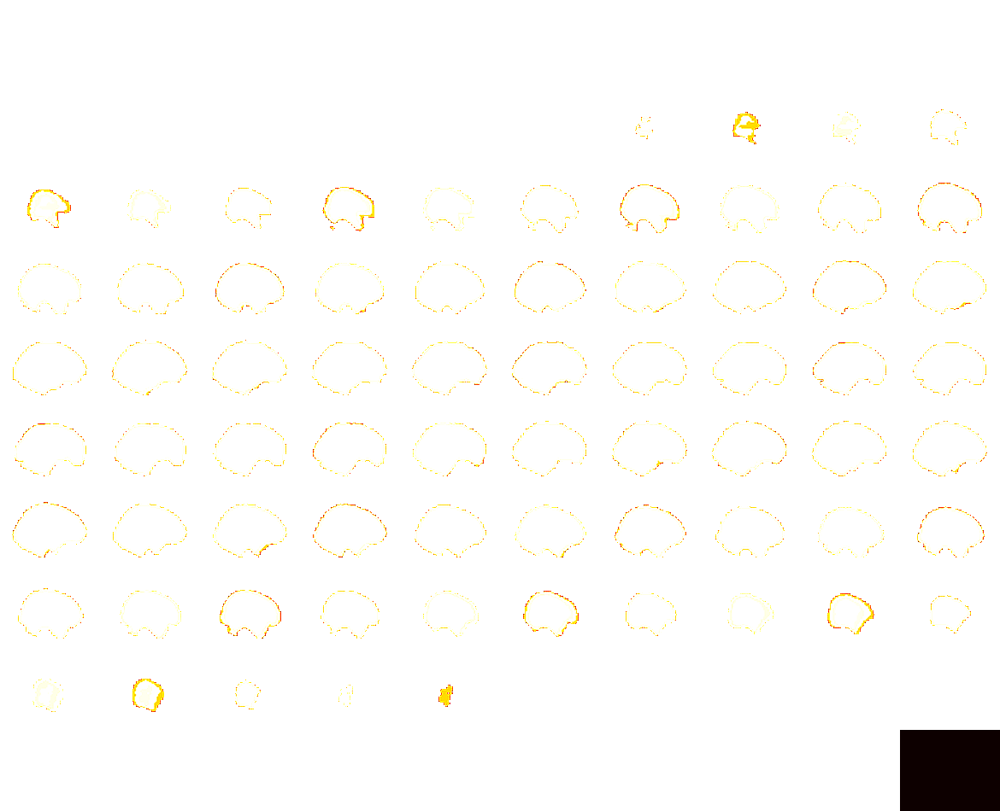

In [33]:
stimuli = ['Pl','Nt','Up']
no_eyeballvoxel_subjects = [4,5,10,11,15,16,17]

sub_mask_list = []
for s, sub in enumerate(no_eyeballvoxel_subjects):

    mask_list = []
    for i, stim in enumerate(stimuli):
        image_path = '../IAPS_fMRI_RSA/fMRI/{}{}.mat'.format(stim,sub-1)
        # load one image to get the dimensions and make the mask
        image_file = sio.loadmat(image_path)
        mask_file = image_file['{}'.format(stim)] #(153594, 100)
        mask_list.append(mask_file)

    allmask = np.hstack(mask_list)
    mask_sum = np.sum(allmask, axis = 1)
    sub_mask_list.append(mask_sum)

allsub_mask = np.vstack(sub_mask_list)
allsub_mask_sum = np.sum(allsub_mask, axis = 0)
mask_flat = (~np.isnan(allsub_mask_sum)).astype(int)
x, y, z = 53,63,46
mask_reshape = mask_flat.reshape(z, y, x)
mask = np.moveaxis(mask_reshape, [0,1,2], [2,1,0])

tmp_image_path = '../IAPS_fMRI_RSA/fMRI/nifti/Nt1.img'
# load one image to get the dimensions and make the mask

tmp_img = nib.load(tmp_image_path)
mask_3d = new_img_like(tmp_img, mask)
view = plotting.view_img(mask_3d)
view

Create searchlight centers and neighbours

In [34]:
centers, neighbors = get_volume_searchlight(mask, radius=5, threshold=0.5)

Finding searchlights...: 100%|██████████| 59159/59159 [00:37<00:00, 1571.85it/s]


Found 56949 searchlights


### Compute Searchlight

In [38]:
SL_eval_score_list = []
SL_RDM_brain_list = []
features_namelist = ["features_pl_1", "features_pl_2", "features_pl_3", "features_pl_4", "features_pl_5", "features_fc_1", "features_fc_2"]

for n, nn_rdm_model in enumerate(nn_rdm_models):
    eval_score_list = []
    RDM_brain_list = []
    
    for i in range(20):
        subj_data = allsub_avg[i]
        subj_data_2d = np.nan_to_num(subj_data)

        image_value = np.arange(6)
        SL_RDM = get_searchlight_RDMs(subj_data_2d, centers, neighbors, image_value, method='correlation')

        eval_results = evaluate_models_searchlight(SL_RDM, nn_rdm_model, eval_fixed, method='spearman', n_jobs=3)

        # get the evaulation score for each voxel
        # We only have one model, but evaluations returns a list. By using float we just grab the value within that list
        eval_score = [np.float(e.evaluations) for e in eval_results]

        # Create an 3D array, with the size of mask, and
        x, y, z = mask.shape
        RDM_brain = np.zeros([x*y*z])
        RDM_brain[list(SL_RDM.rdm_descriptors['voxel_index'])] = eval_score
        RDM_brain = RDM_brain.reshape([x, y, z])

        eval_score_list.append(eval_score)
        RDM_brain_list.append(RDM_brain)

    SL_eval_score_list.append(eval_score_list)
    SL_RDM_brain_list.append(RDM_brain_list)

SL_feat_eval_score = dict(zip(features_namelist, SL_eval_score_list))
SL_feat_RDM_brain = dict(zip(features_namelist, SL_RDM_brain_list))

Evaluating models for each searchlight: 100%|██████████| 56949/56949 [00:55<00:00, 1034.60it/s]
C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\703930719.py:20: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eval_score = [np.float(e.evaluations) for e in eval_results]
Evaluating models for each searchlight: 100%|██████████| 56949/56949 [00:48<00:00, 1186.11it/s]


### Export/Load searchlight results

In [39]:
# Export
# Save the evaluation scores and RDMs.

pd.DataFrame(SL_feat_eval_score).to_csv("./outputs/20sub_SL_eval_score_nn_6cont.csv")
dbfile= open('./outputs/20sub_SL_rdm_brain_nn_6cont', 'ab')
pickle.dump(SL_feat_RDM_brain, dbfile)                     
dbfile.close()

In [ ]:
# Import
SL_feat_eval_score_df = pd.read_csv("./outputs/20sub_SL_eval_score_nn.csv")
SL_feat_eval_score = SL_feat_eval_score_df.values.tolist()
dbfile = open('./outputs/20sub_SL_rdm_brain_nn', 'rb')     
SL_feat_RDM_brain = pickle.load(dbfile)

## Plot results

### Correlation distribution across subject

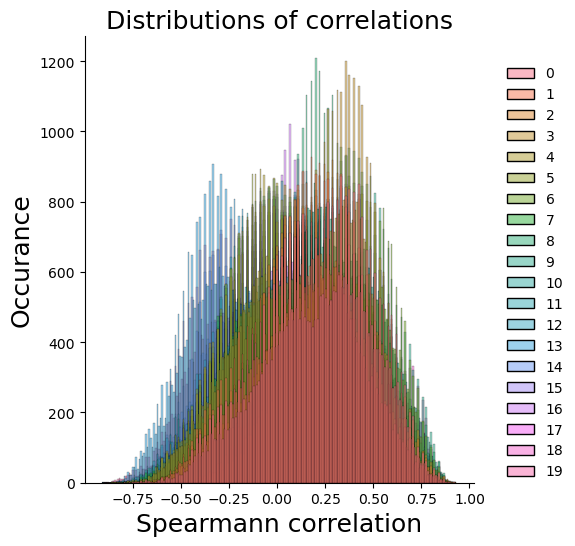

In [69]:
sns.displot(SL_feat_eval_score[features_namelist[0]])
plt.title('Distributions of correlations', size=18)
plt.ylabel('Occurance', size=18)
plt.xlabel('Spearmann correlation', size=18)
sns.despine()
plt.show()

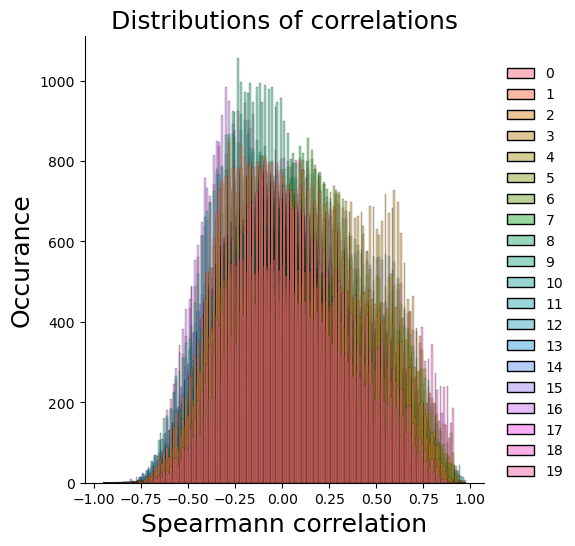

In [70]:
sns.displot(SL_feat_eval_score[features_namelist[1]])
plt.title('Distributions of correlations', size=18)
plt.ylabel('Occurance', size=18)
plt.xlabel('Spearmann correlation', size=18)
sns.despine()
plt.show()

## Across subject plots

### Max Pooling 1

In [40]:
RDM_brain = SL_feat_RDM_brain["features_pl_1"]

for i in range(20):
    sl_max = np.max(RDM_brain[i])
    sl_min = np.min(RDM_brain[i])
    sl_mid = np.median(RDM_brain[i])
    print("Subject{} max:{}, mid:{}, min:{}".format(i+1,sl_max,sl_mid, sl_min ))

Subject1 max:0.9178571428571428, mid:0.0, min:-0.7964285714285714
Subject2 max:0.8928571428571428, mid:0.0, min:-0.7428571428571429
Subject3 max:0.9249999999999999, mid:0.0, min:-0.7928571428571428
Subject4 max:0.9214285714285715, mid:0.0, min:-0.6071428571428571
Subject5 max:0.8464285714285713, mid:0.0, min:-0.8571428571428571
Subject6 max:0.9142857142857143, mid:0.0, min:-0.8642857142857142
Subject7 max:0.9214285714285715, mid:0.0, min:-0.5821428571428572
Subject8 max:0.8785714285714286, mid:0.0, min:-0.8178571428571428
Subject9 max:0.9035714285714286, mid:0.0, min:-0.5357142857142857
Subject10 max:0.907142857142857, mid:0.0, min:-0.8535714285714285
Subject11 max:0.8642857142857142, mid:0.0, min:-0.825
Subject12 max:0.8571428571428571, mid:0.0, min:-0.8
Subject13 max:0.8678571428571428, mid:0.0, min:-0.8214285714285714
Subject14 max:0.8107142857142856, mid:0.0, min:-0.907142857142857
Subject15 max:0.932142857142857, mid:0.0, min:-0.825
Subject16 max:0.8857142857142857, mid:0.0, min:-

In [47]:
RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)
    sl_max = np.max(RDM_brain_bin_list[i])
    sl_min = np.min(RDM_brain_bin_list[i])
    print("Subject{} max:{}, min:{}".format(i+1,sl_max,sl_min ))    

Subject1 max:1, min:0
Subject2 max:1, min:0
Subject3 max:1, min:0
Subject4 max:1, min:0
Subject5 max:1, min:0
Subject6 max:1, min:0
Subject7 max:1, min:0
Subject8 max:1, min:0
Subject9 max:1, min:0
Subject10 max:1, min:0
Subject11 max:1, min:0
Subject12 max:1, min:0
Subject13 max:1, min:0
Subject14 max:1, min:0
Subject15 max:1, min:0
Subject16 max:1, min:0
Subject17 max:1, min:0
Subject18 max:1, min:0
Subject19 max:1, min:0
Subject20 max:1, min:0


In [48]:
RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
sl_bin_max = np.max(SL_threshcount)
sl_bin_min = np.min(SL_threshcount)
print("max:{}, min:{}".format(sl_bin_max,sl_bin_min ))

max:10, min:0


In [72]:
SL_threshcount.shape

(53, 63, 46)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



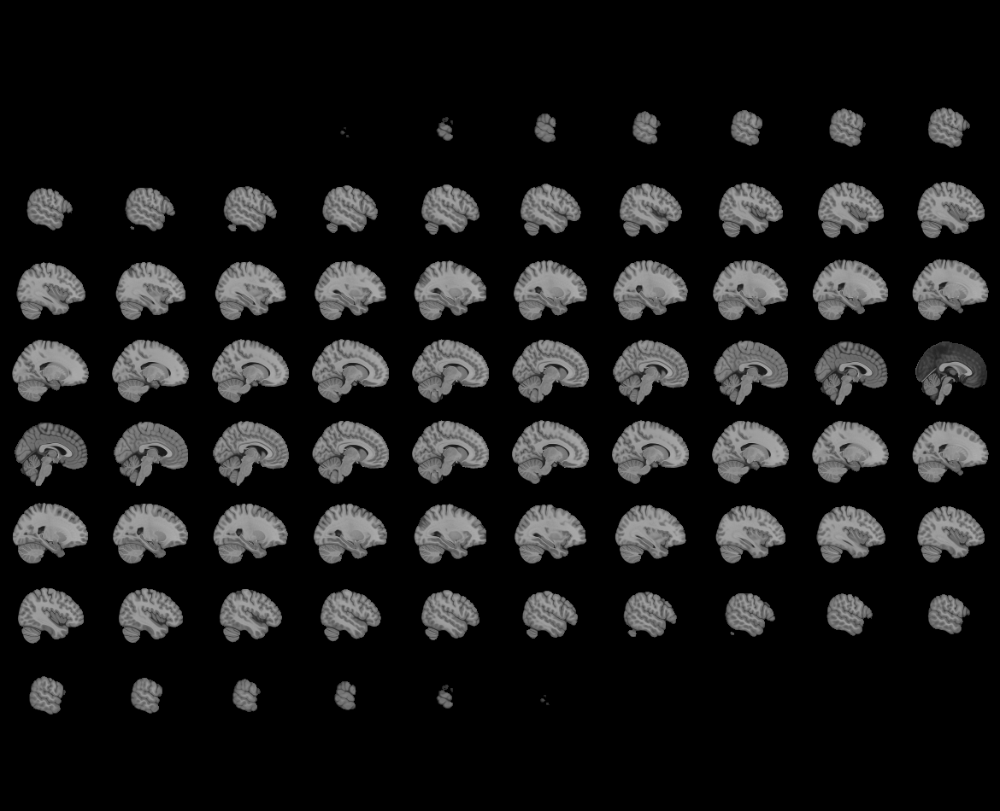
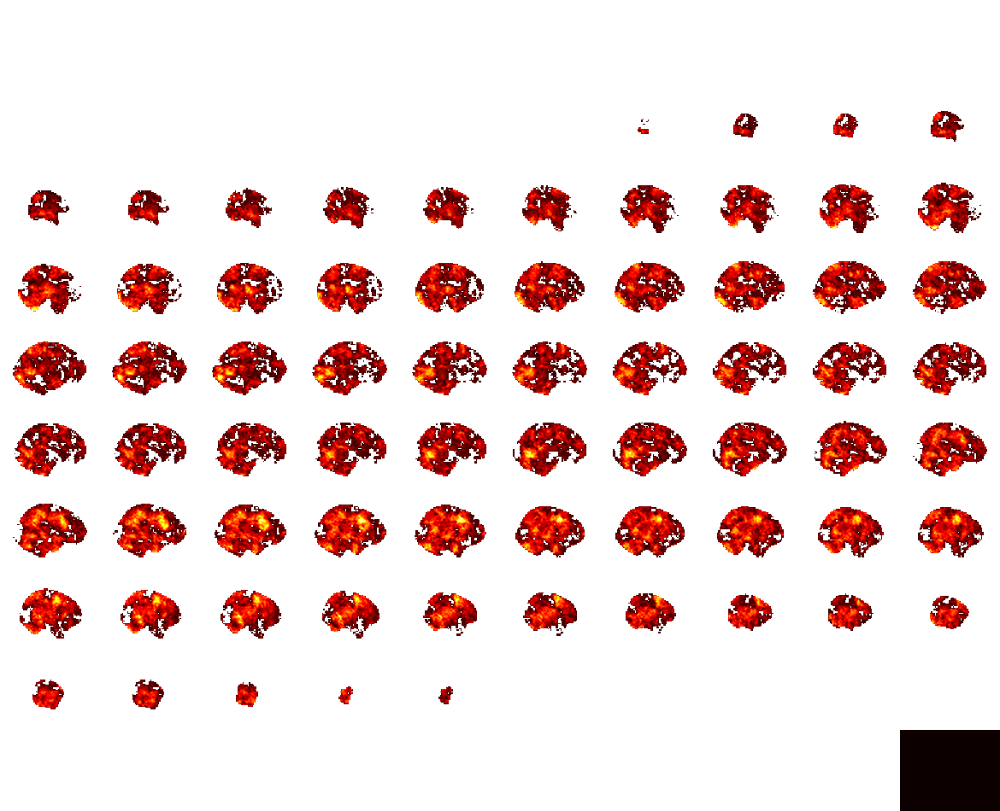

In [49]:
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 2

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



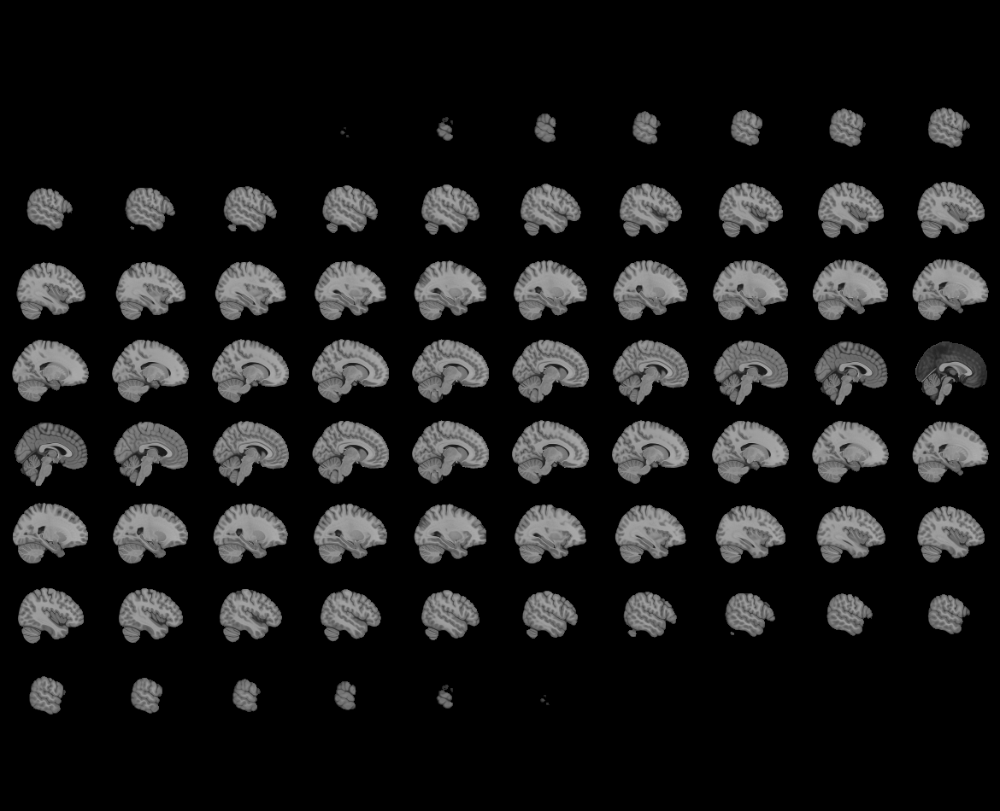
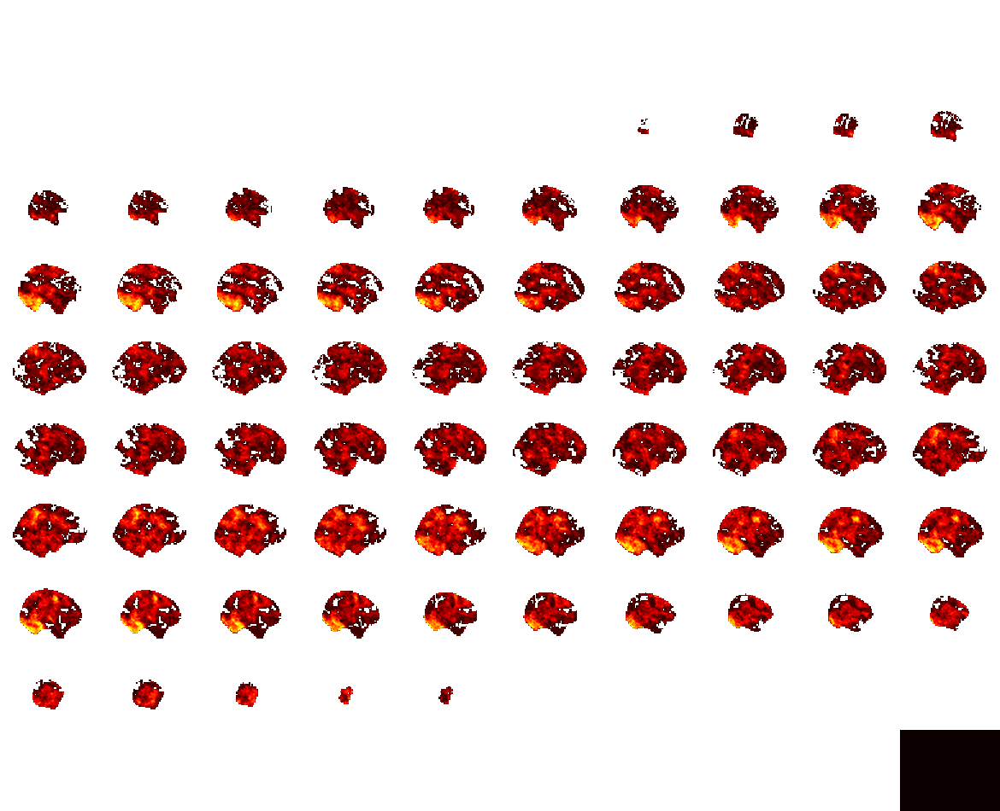

In [59]:
RDM_brain = SL_feat_RDM_brain[features_namelist[1]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 3

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



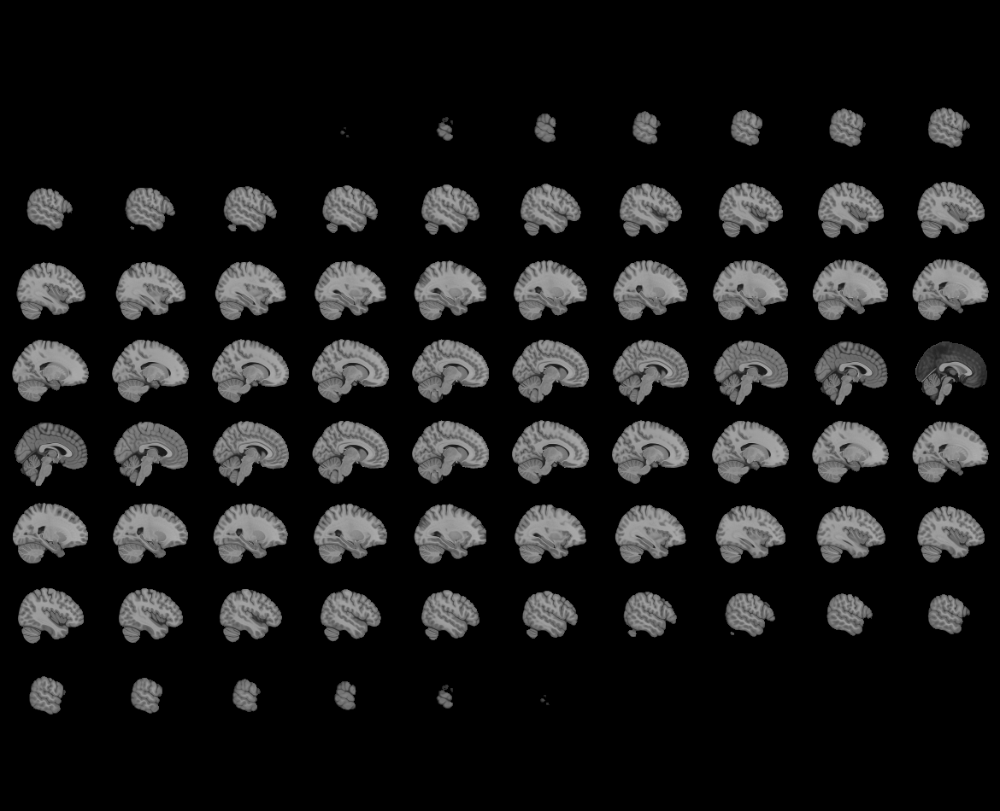
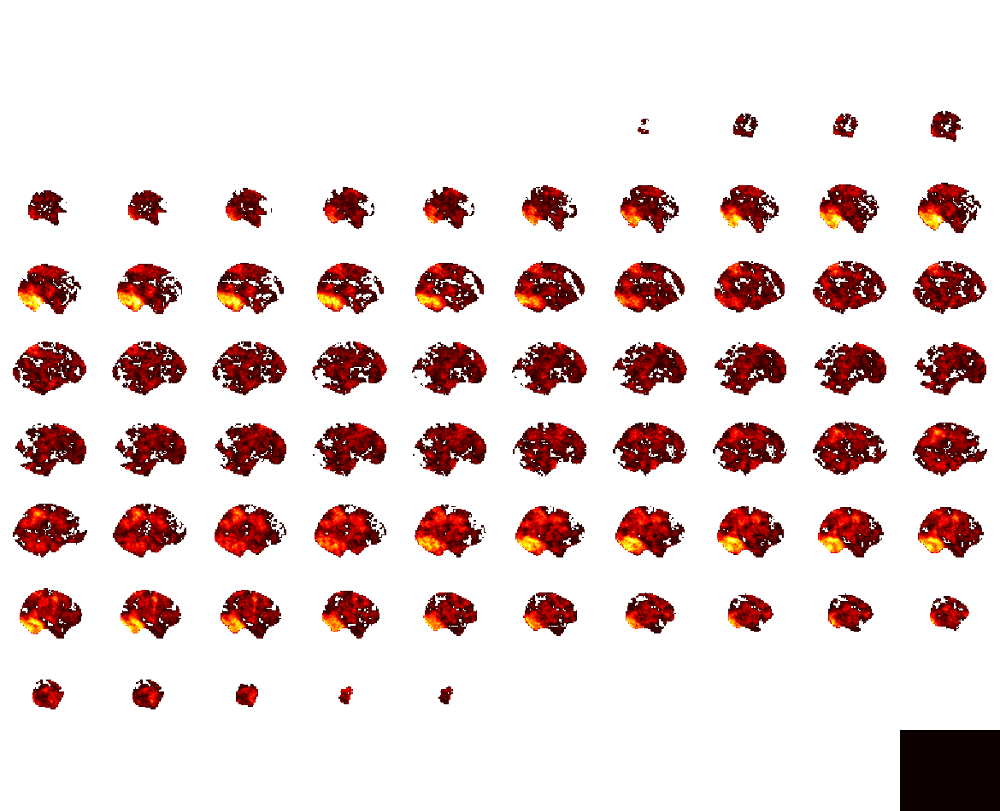

In [61]:
RDM_brain = SL_feat_RDM_brain[features_namelist[2]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 4

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



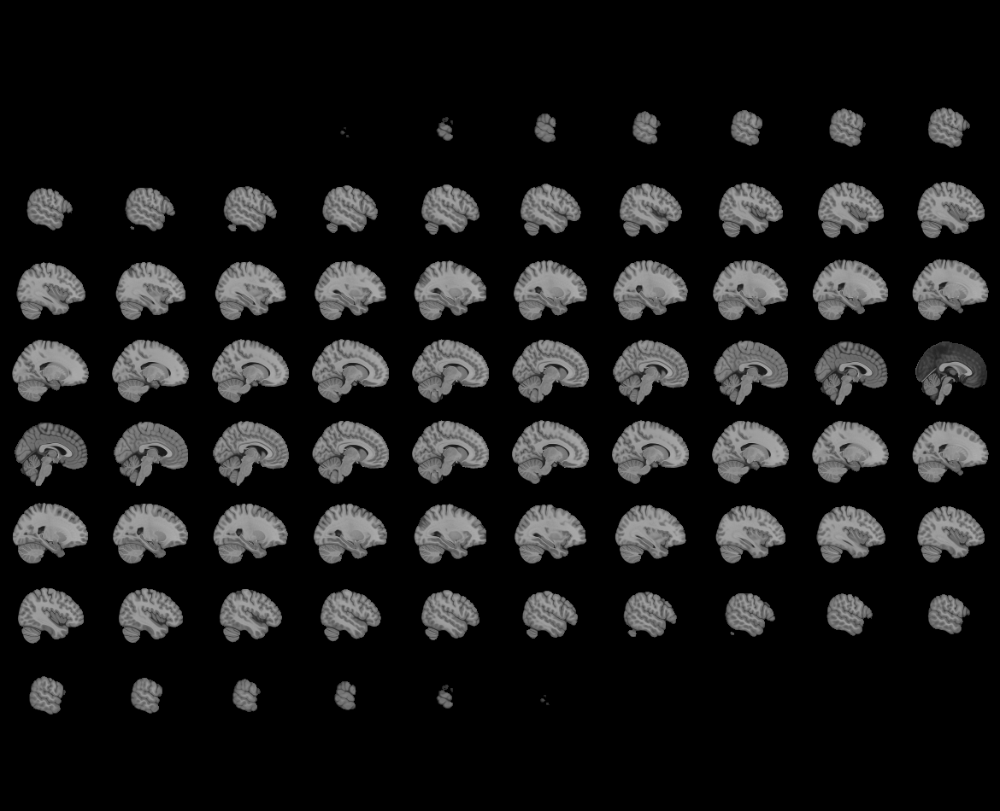
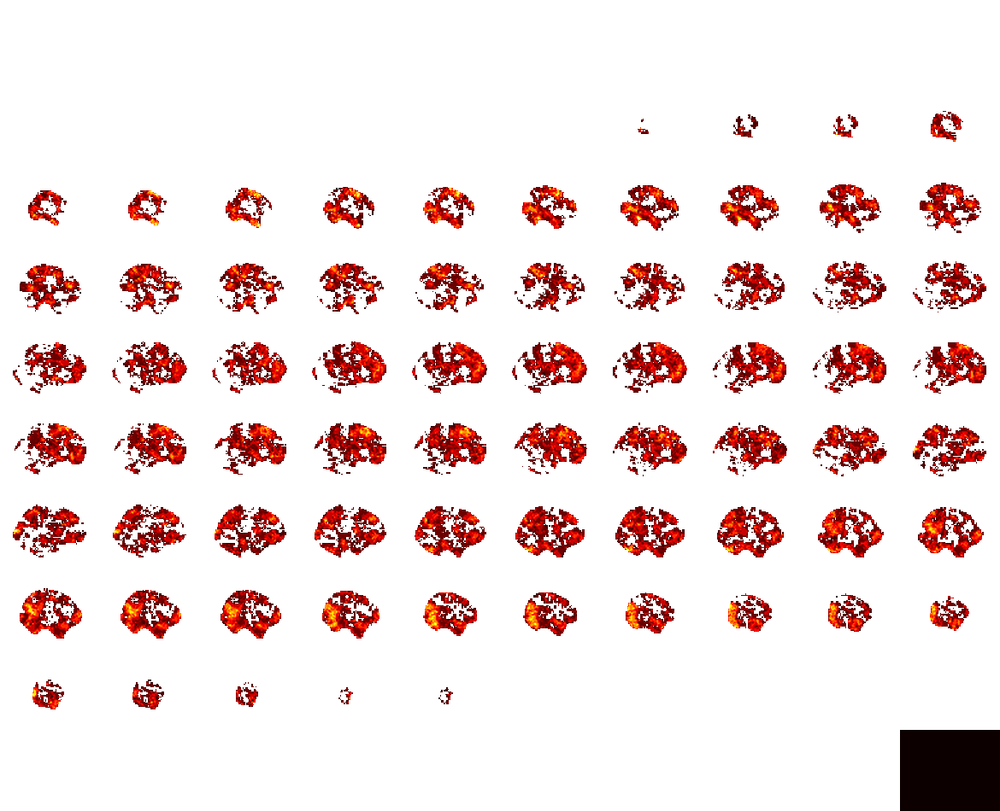

In [62]:
RDM_brain = SL_feat_RDM_brain[features_namelist[3]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 5

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



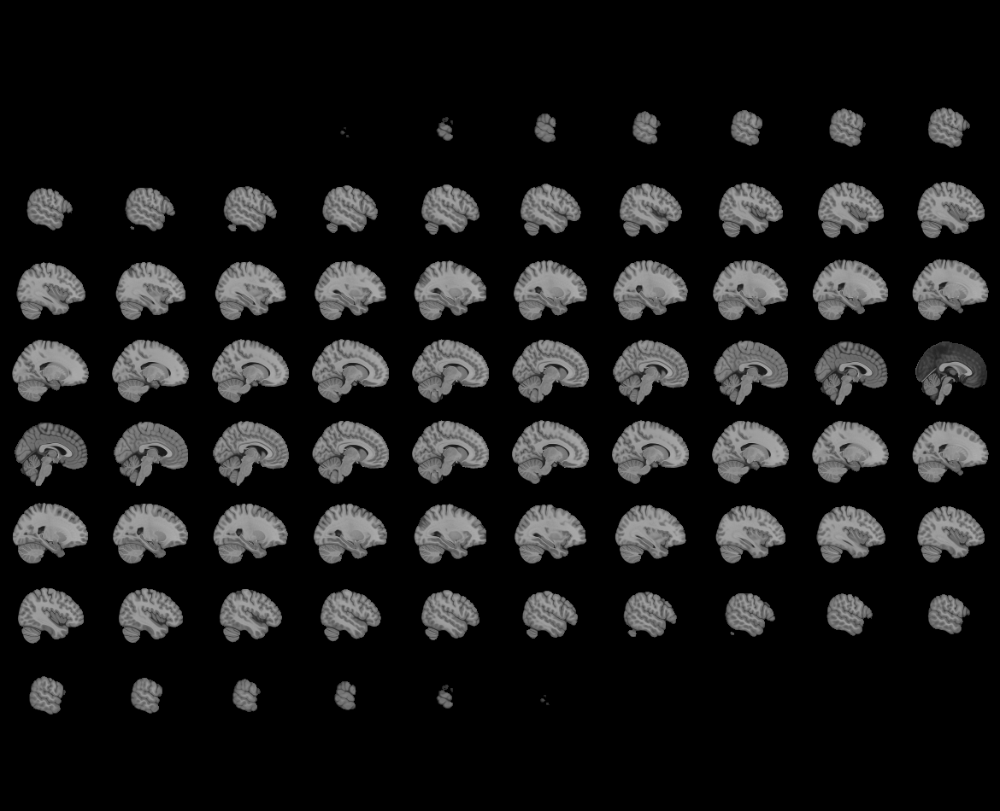
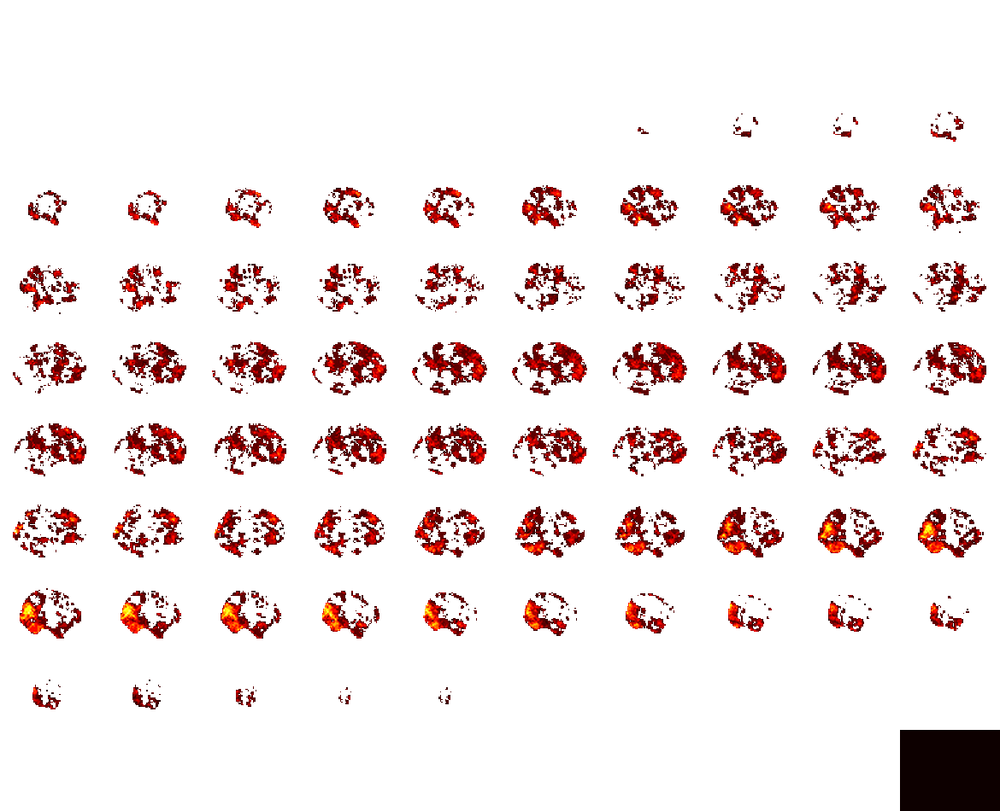

In [63]:
RDM_brain = SL_feat_RDM_brain[features_namelist[4]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Fully Connected 1

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



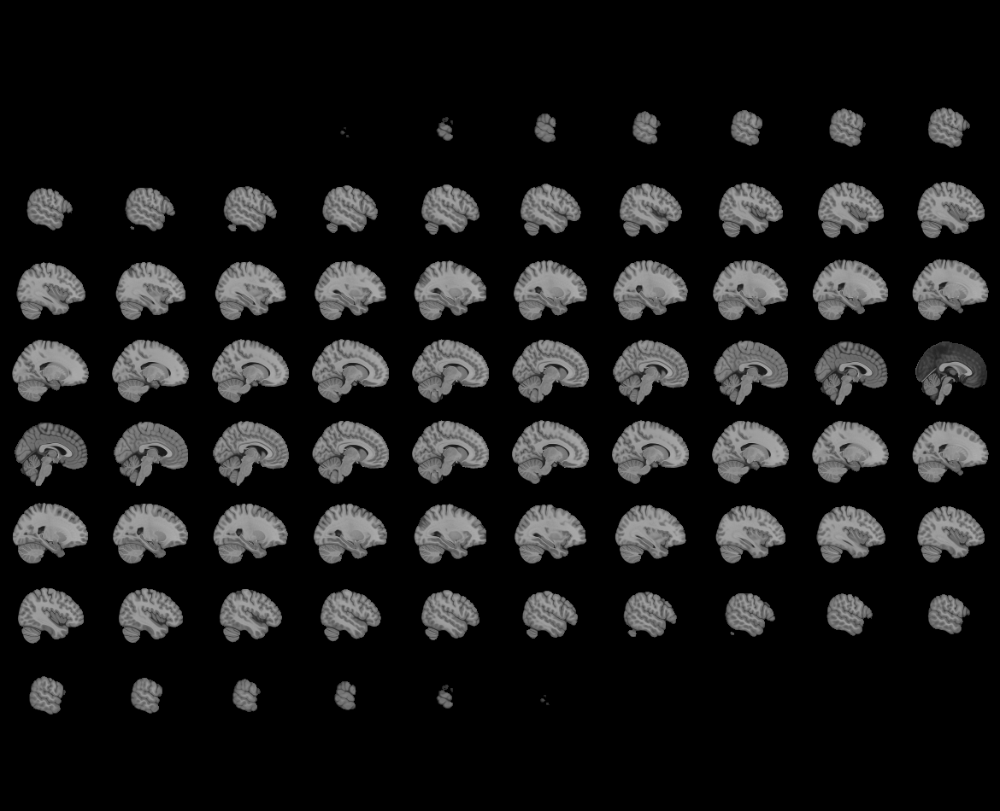
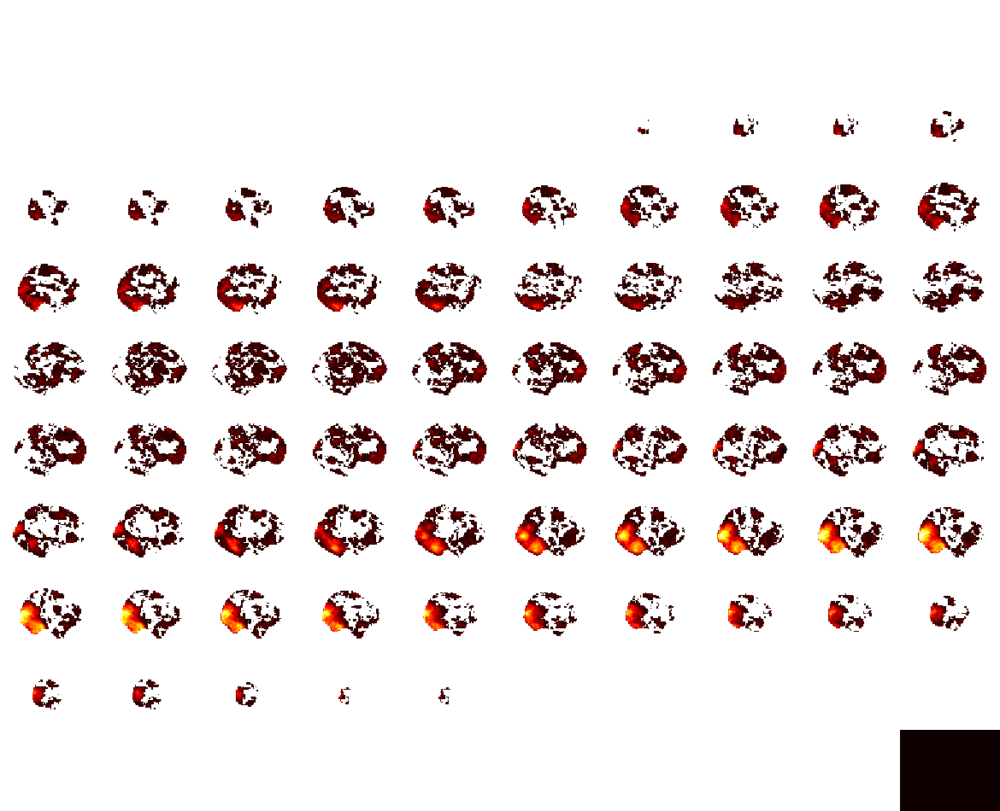

In [64]:
RDM_brain = SL_feat_RDM_brain[features_namelist[5]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Fully Connected 2

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



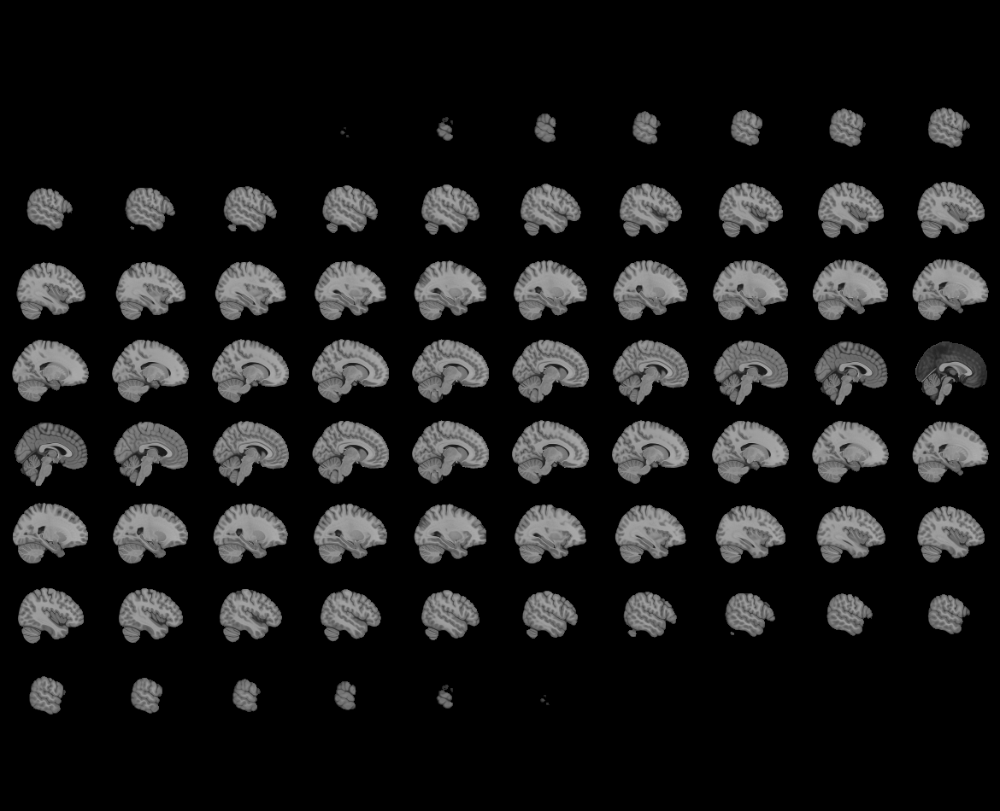
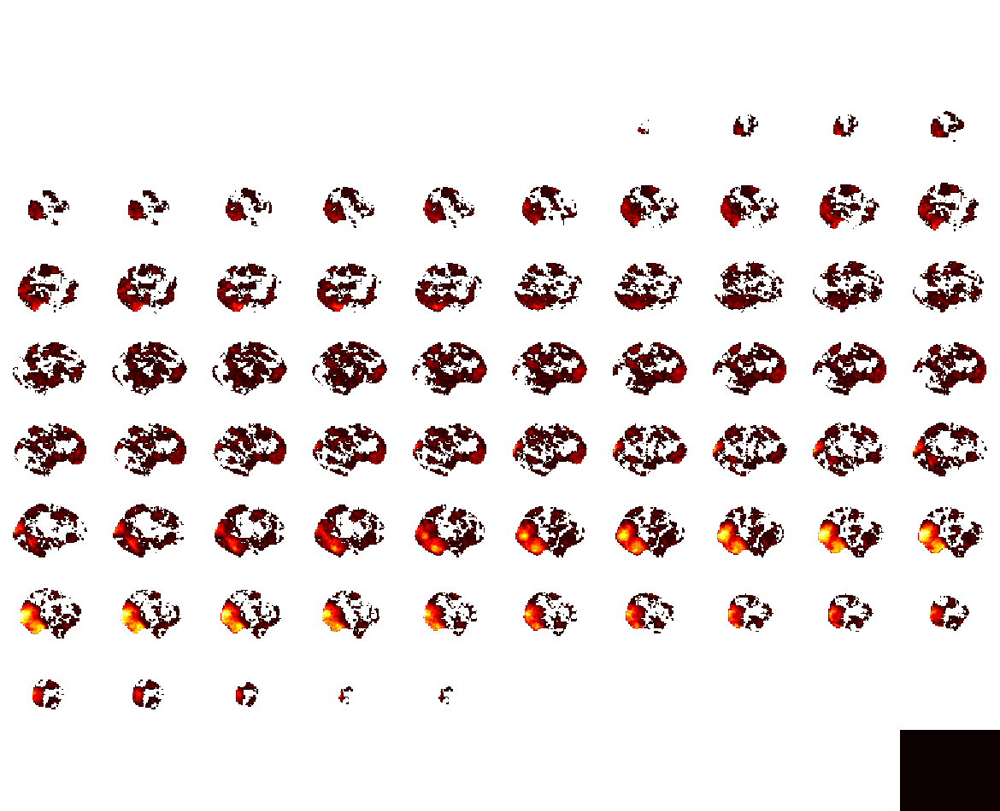

In [66]:
RDM_brain = SL_feat_RDM_brain[features_namelist[6]]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.5, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

## Group analysis
When these results are used for group analysis across multiple subjects, it may be good to Fisher-transform the correlation values, so that they are more normally distributed.

### MP 1

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\3400419484.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



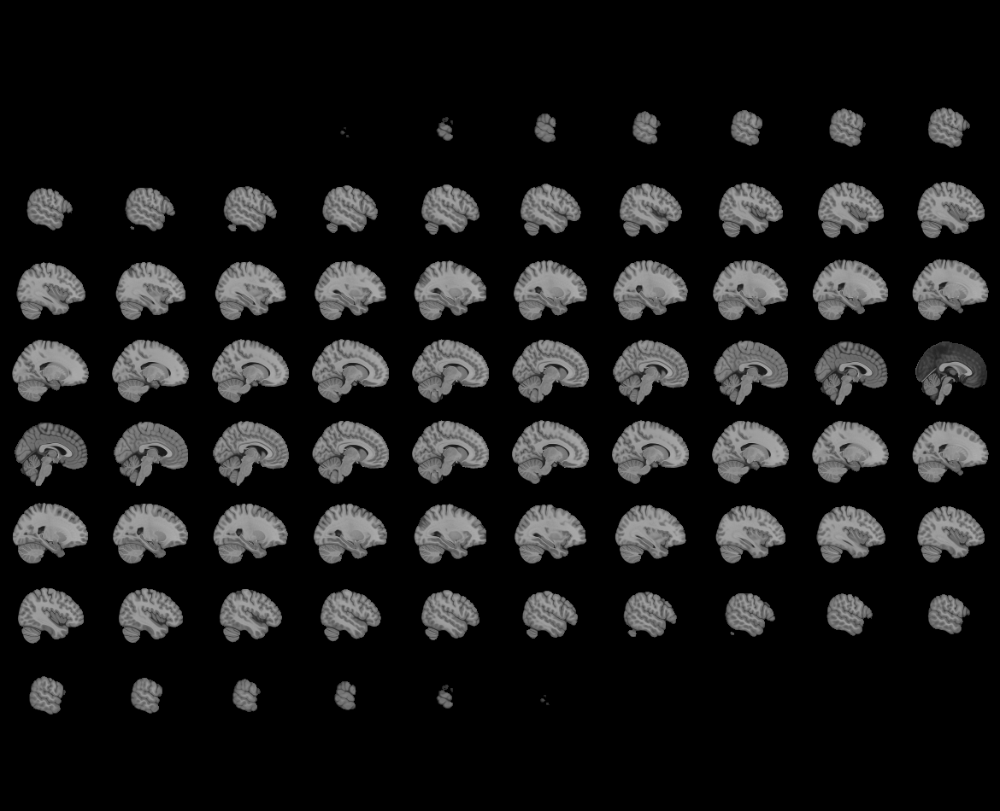
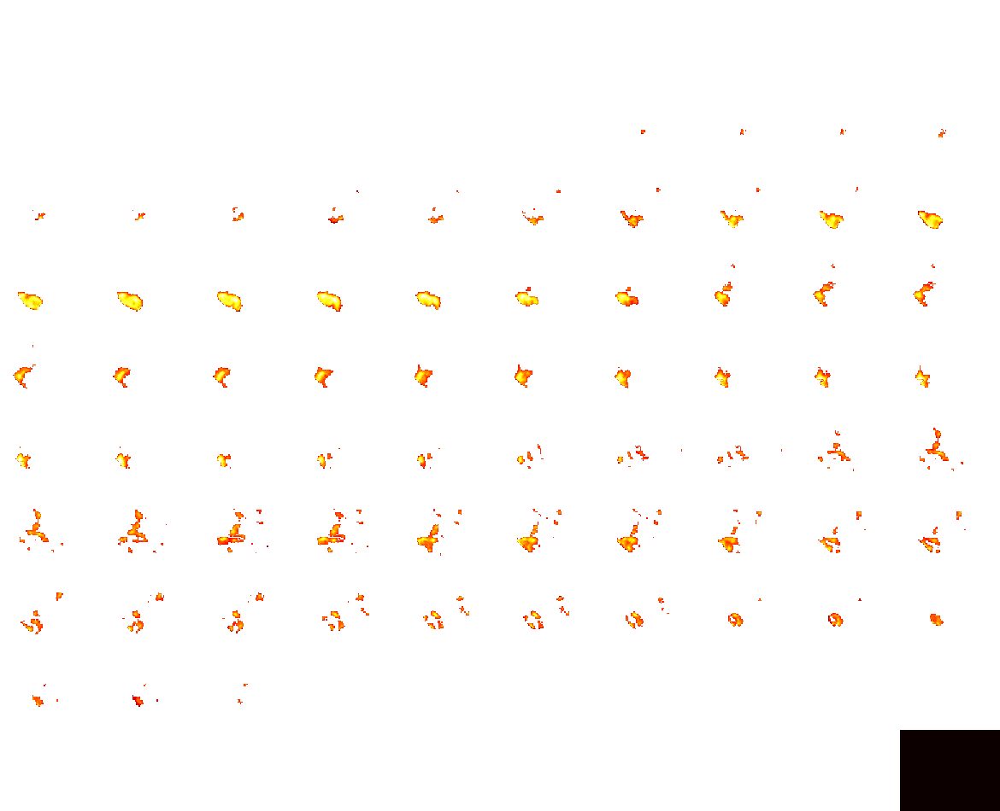

In [105]:
threshold = 2 # p < 0.01
layer_counter = 0

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[0]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_mp1.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP2

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\3613995691.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



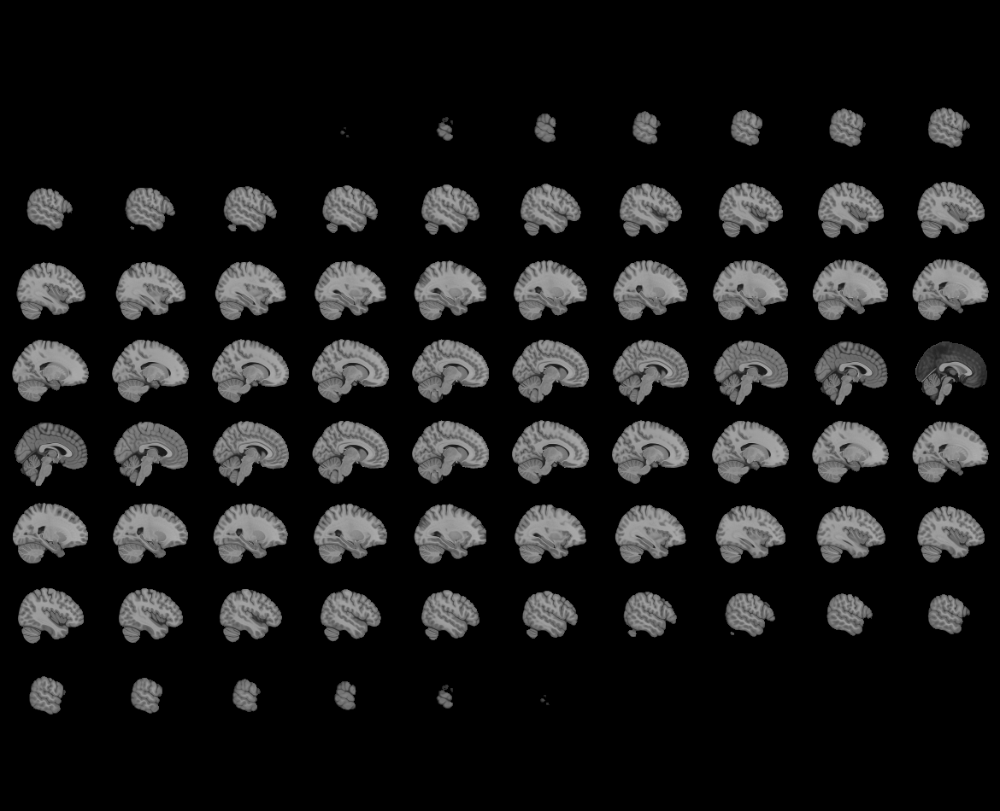
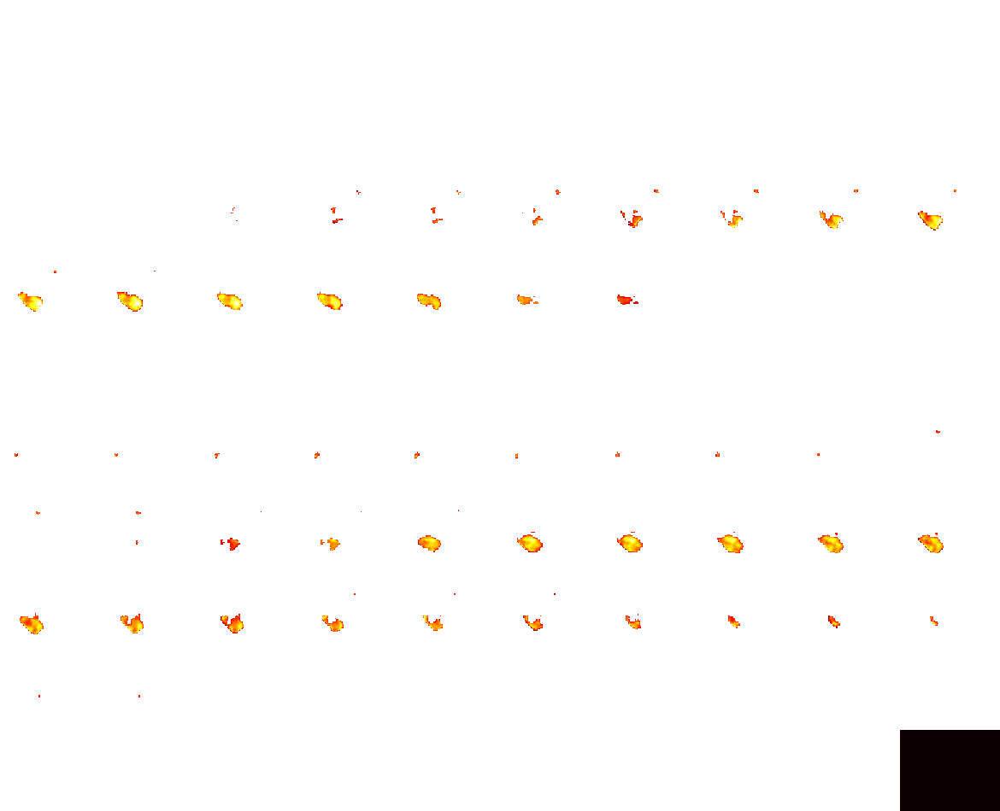

In [104]:
threshold = 2 # p < 0.01
layer_counter = 1

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_mp2.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 3

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\668472111.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



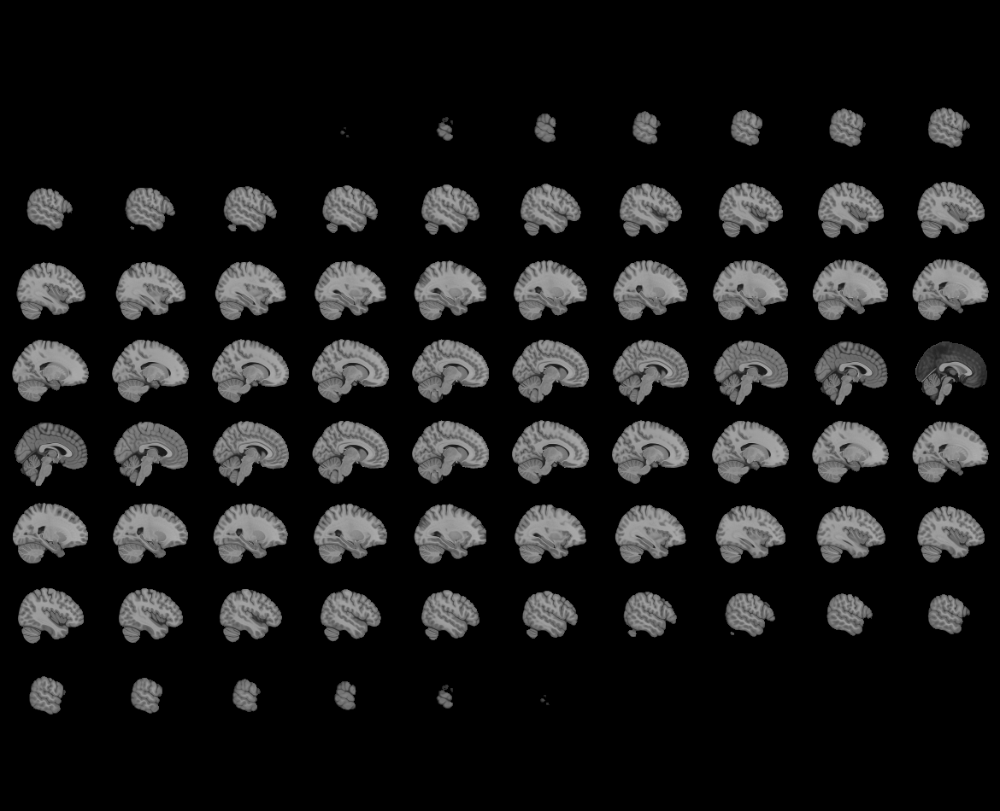
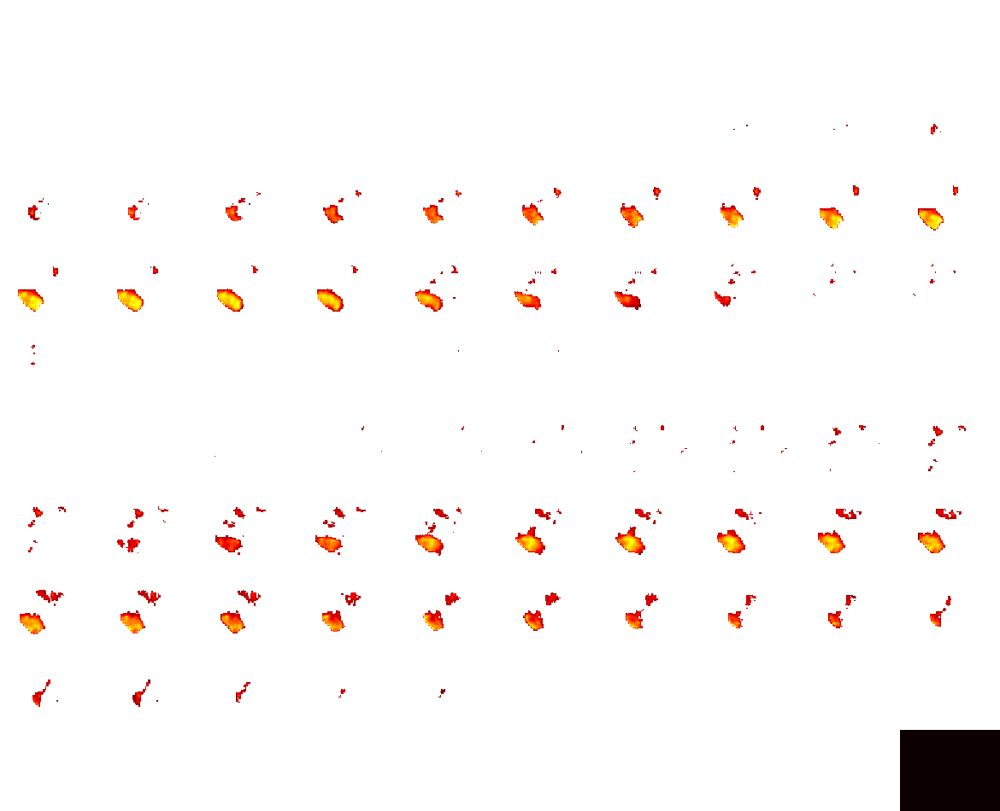

In [102]:
threshold = 2 # p < 0.01
layer_counter = 2

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_mp3.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 4

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\2024736128.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



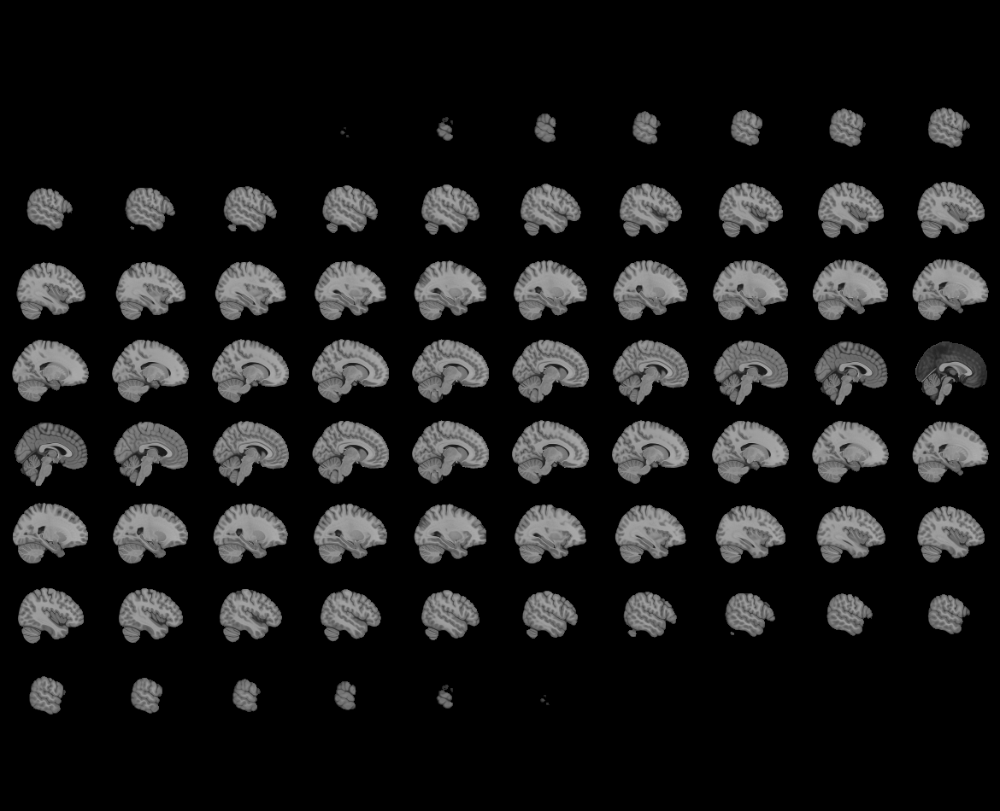
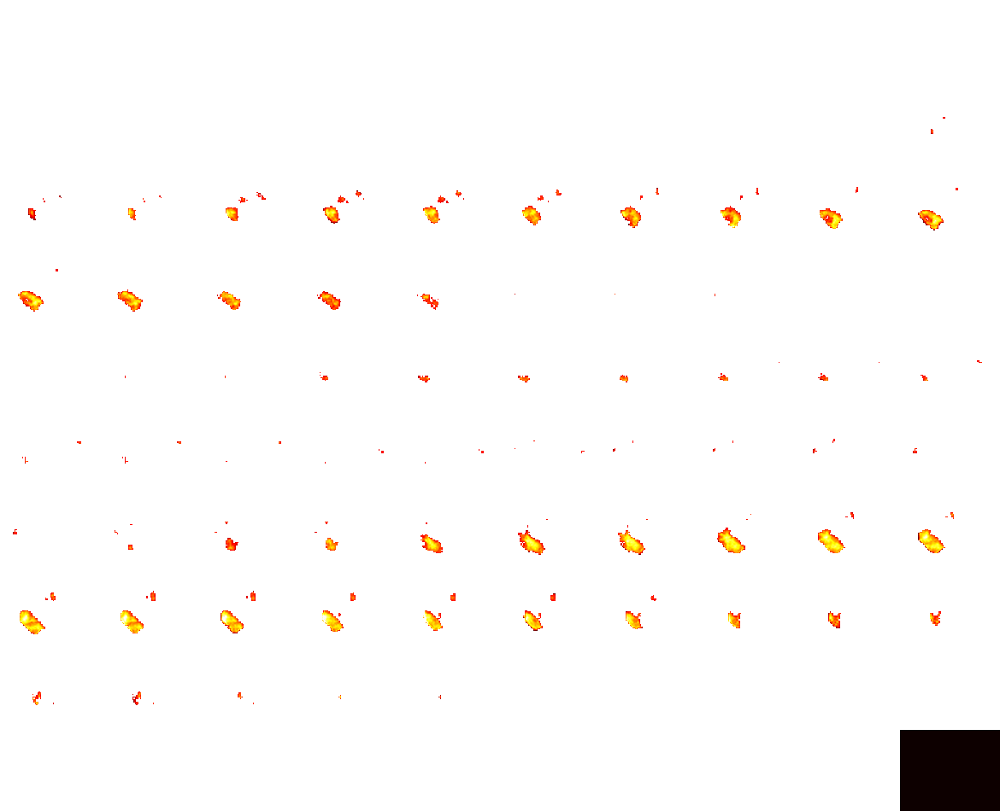

In [103]:
threshold = 2 # p < 0.01
layer_counter = 3

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_mp4.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 5

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\68340131.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



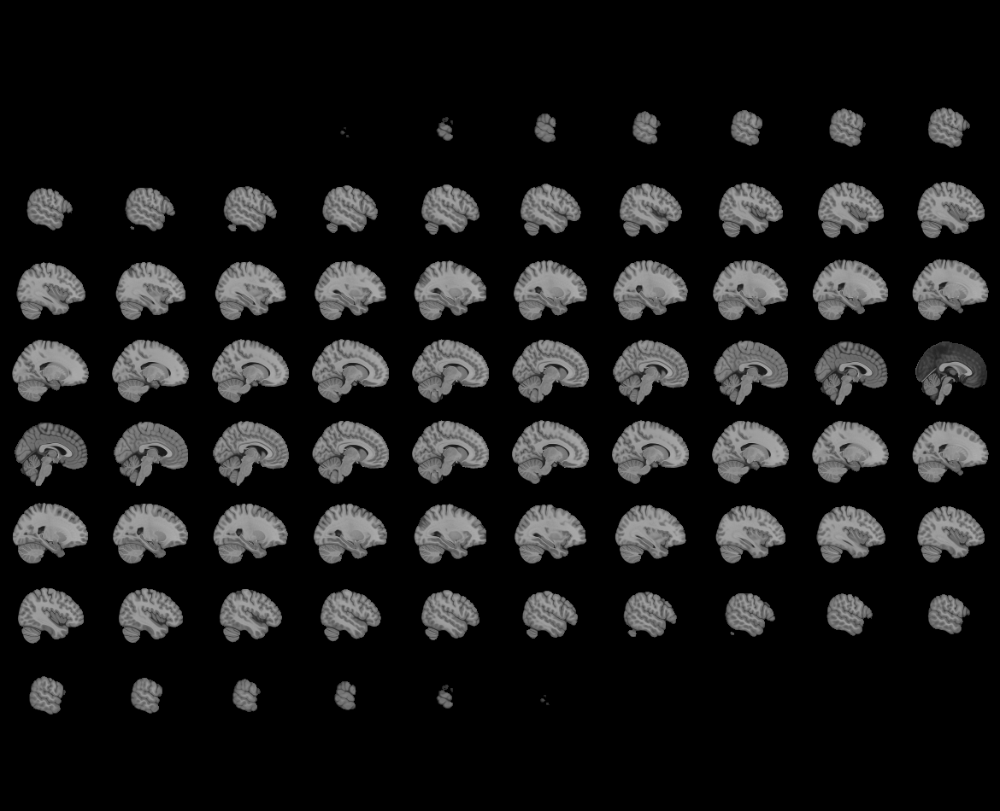
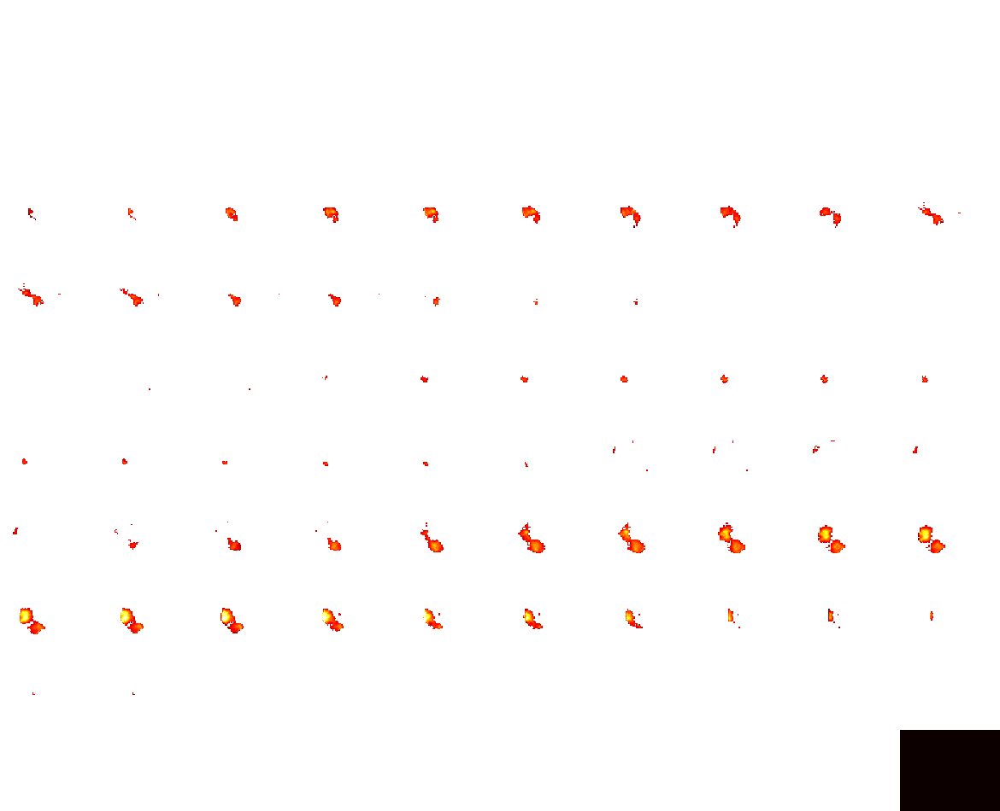

In [99]:
threshold = 2 # p < 0.01
layer_counter = 4

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_mp5.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### FC 1

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\2315651851.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



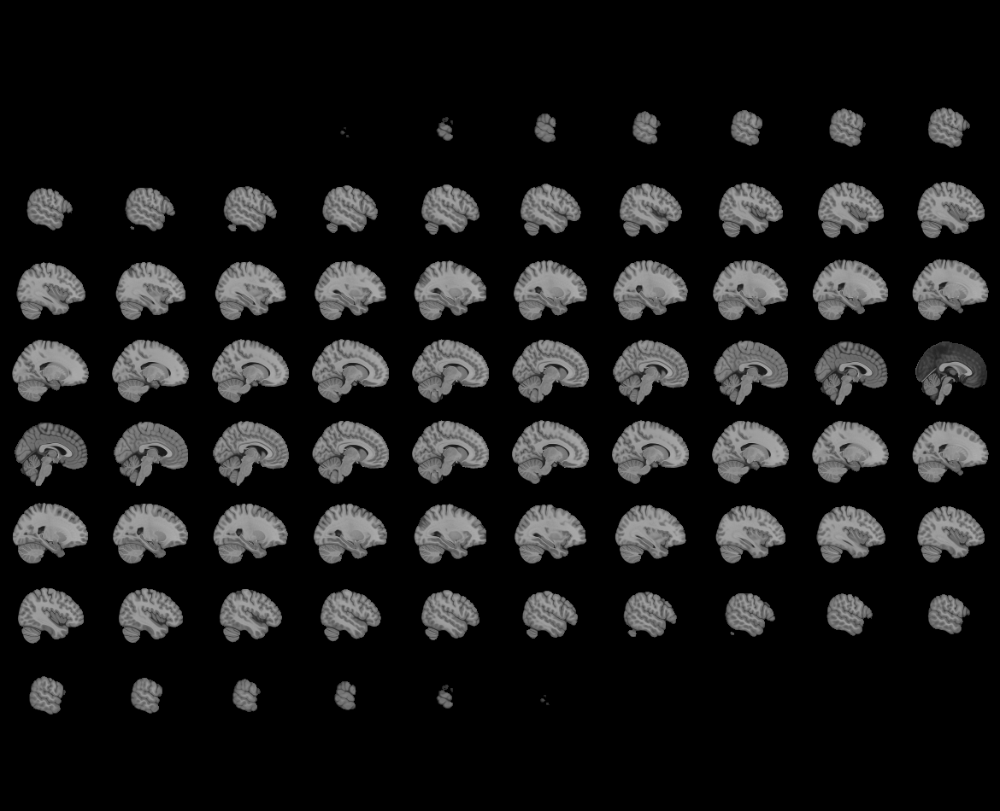
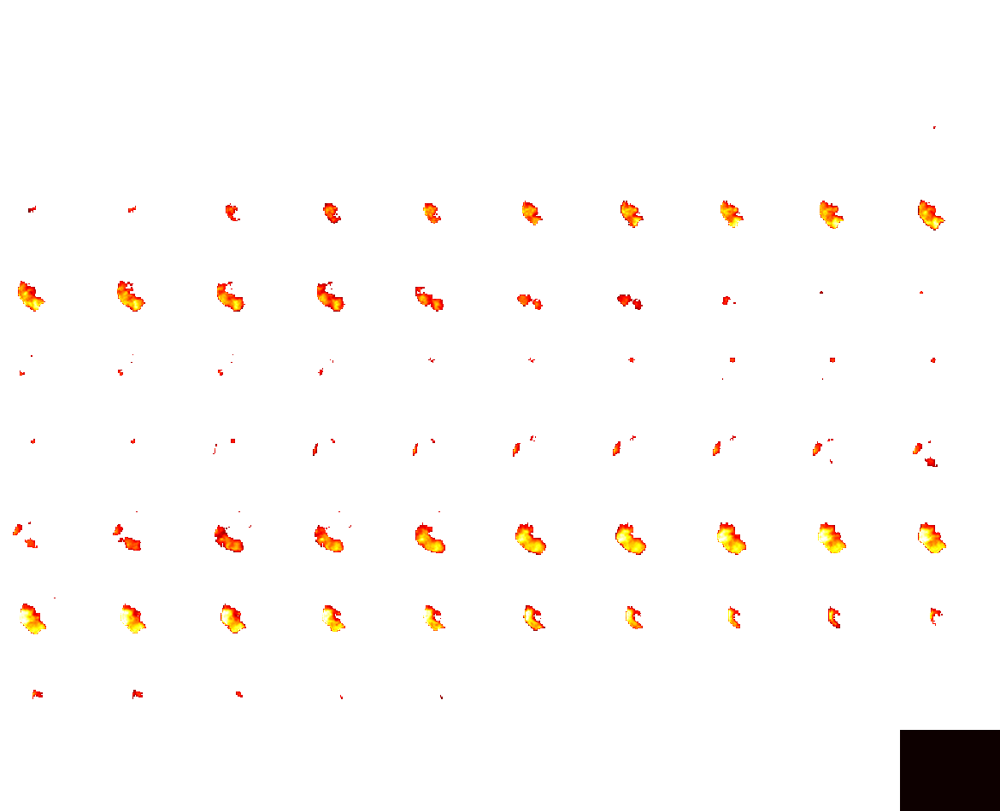

In [98]:
threshold = 2 # p < 0.01
layer_counter = 5

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_fc1.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### FC 2

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14812\381838567.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



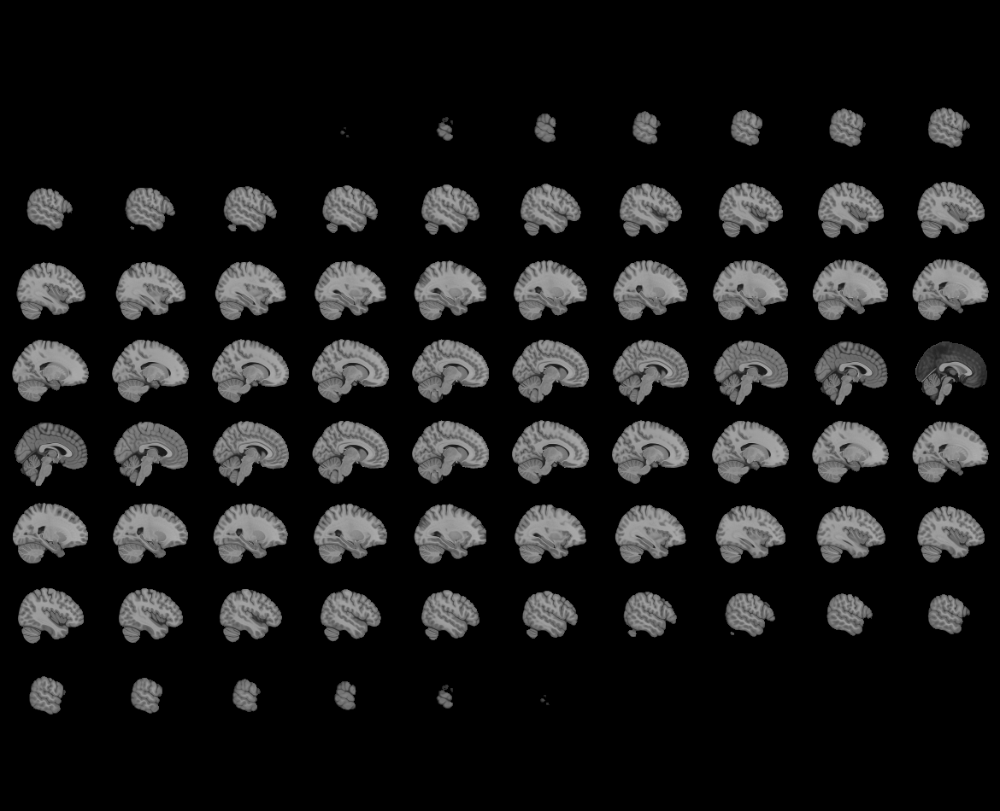
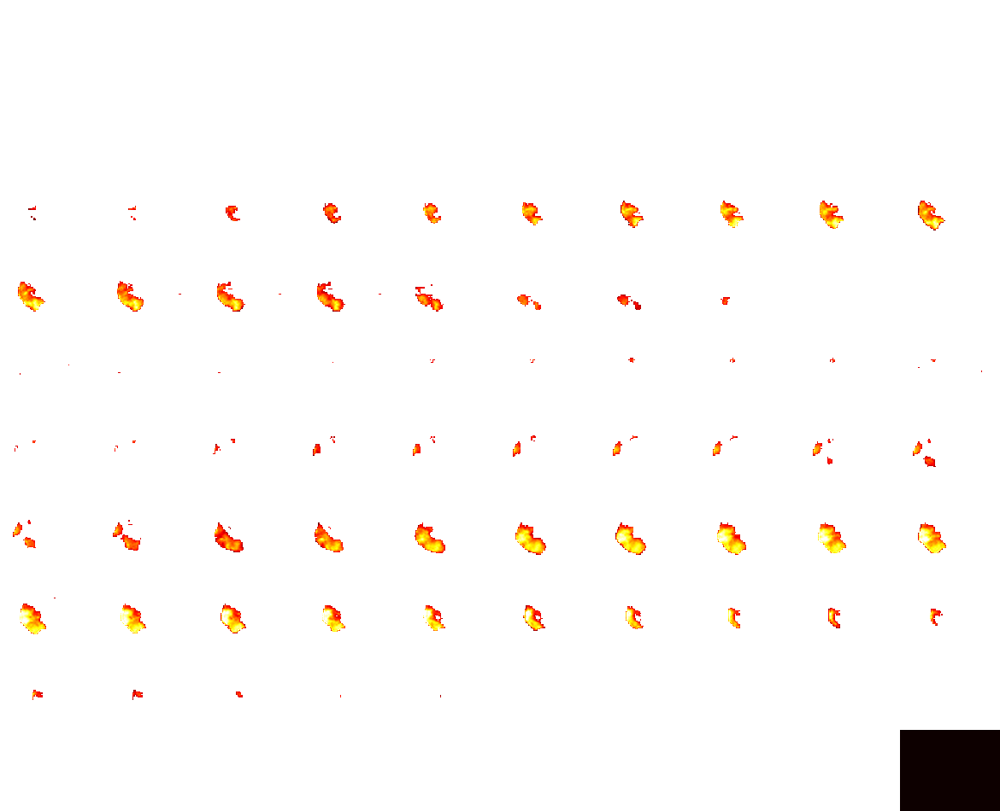

In [97]:
threshold = 2 # p < 0.01
layer_counter = 6

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn6_fc2.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

In [86]:
# threshold = 2 # p < 0.01

# fig, axes = plt.subplots(figsize=(8, 20), nrows=7, ncols=1)
# img_counter = 0
# for i_row in range(7):
#     for j_col in range(1):
#         ax = axes[i_row, j_col]
#         # fisher z tranformation
#         eval_score_list = SL_feat_eval_score[features_namelist[img_counter]]
#         eval_score_array = np.array(eval_score_list)
#         seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

#         # t-test
#         t_stat_list = []
#         p_value_list = []

#         for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
#             t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
#             t_stat_list.append(t_statistic)
#             p_value_list.append(p_value)

#         t_stat_array = np.array(t_stat_list)
#         p_value_array = np.array(p_value_list)

#         # corrected p=values
#         reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
#         x, y, z = mask.shape
#         corrected_p_value_array = np.empty([x*y*z])
#         corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

#         # convert the p=values to negative log10
#         neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
#         neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

#         # plot the negative log10 p=values
#         plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
#         plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)

#         ax.set_title(features_namelist[img_counter])
#         img_counter += 1

# fig.suptitle('Correlation between Neural RDM and NN features\n(negative log10 p-values)')
# plt.show()